In [1]:
import cv2
import numpy as np
from skimage import io
from matplotlib import pyplot as plt
from IPython.core.pylabtools import figsize

from skimage.feature import peak_local_max
from skimage.morphology import watershed
from scipy import ndimage
import imutils

def watershed_n_plot(D, thresh, img, min_distance=20):
    localMax = peak_local_max(D, indices=False, min_distance=min_distance, labels=thresh)
 
    # perform a connected component analysis on the local peaks,
    # using 8-connectivity, then appy the Watershed algorithm
    markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
    labels = watershed(-D, markers, mask=thresh)
    print("[INFO] {} unique segments found".format(len(np.unique(labels)) - 1))

    label_hue = np.uint8(179*labels/np.max(labels))
    blank_ch = 255*np.ones_like(label_hue)
    labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

    # cvt to BGR for display
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

    # set bg label to black
    labeled_img[label_hue==0] = 0

    #cv2_imshow(img)
    plt.subplot(1,2,1)
    plt.imshow(labeled_img)

    image = img.copy()

    for label in np.unique(labels):
        # if the label is zero, we are examining the 'background'
        # so simply ignore it
        if label == 0:
            continue

        # otherwise, allocate memory for the label region and draw
        # it on the mask
        mask = np.zeros(gray.shape, dtype="uint8")
        mask[labels == label] = 255 
        #cv2_imshow(mask)#[labels == label] = 255   
        # detect contours in the mask and grab the largest one
        cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        c = max(cnts, key=cv2.contourArea)

        # draw a circle enclosing the object
        ((x, y), r) = cv2.minEnclosingCircle(c)
        cv2.circle(image, (int(x), int(y)), int(r), (0, 255, 0), 2)
        cv2.putText(image, "#{}".format(label), (int(x) - 10, int(y)),
        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

    # show the output image
    plt.subplot(1,2,2)
    plt.imshow(image)

In [2]:
imgs = [cv2.cvtColor(cv2.imread("images/count/count{}.jpg".format(i)), cv2.COLOR_BGR2RGB) for i in range(1,13)]
grayscaled = [cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
              for img in imgs]

In [3]:
figsize(15, 15)

# 1

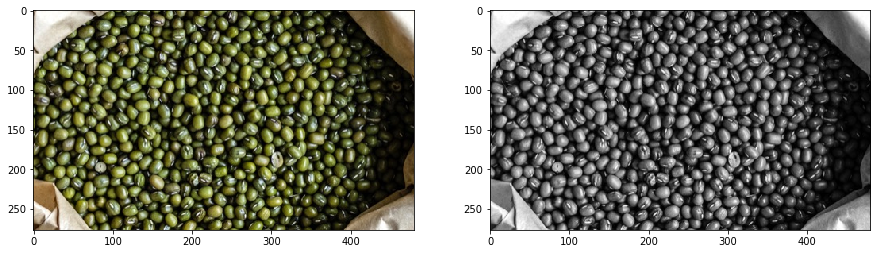

In [403]:
plt.subplot(1,2,1)
plt.imshow(imgs[0])
plt.subplot(1,2,2)
plt.imshow(grayscaled[0], cmap='gray')

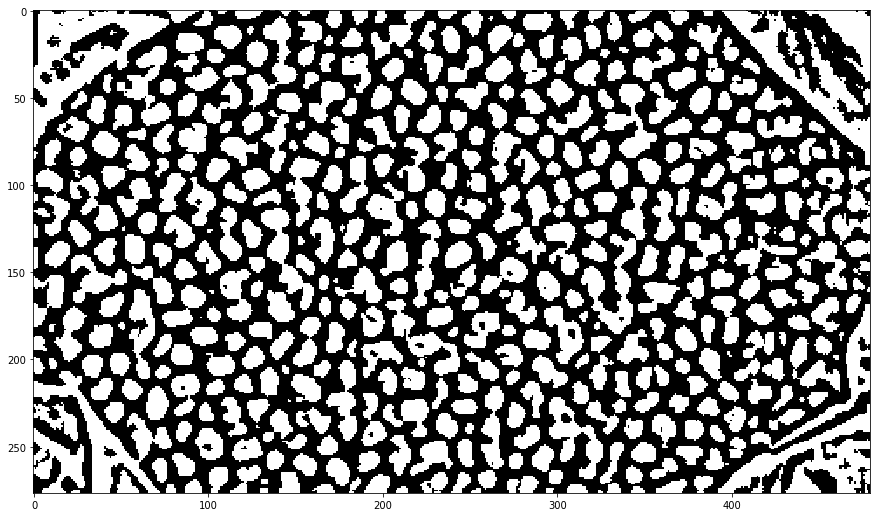

In [408]:
#shifted = cv2.pyrMeanShiftFiltering(imgs[0], 11, 21)
#gray = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)
#

gray = grayscaled[0]
gray = cv2.GaussianBlur(gray, (5,5), 15)
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,15, 1)
#retval, im = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
#retval, thresh = cv2.threshold(gray, 160, 255, cv2.THRESH_BINARY)
#thresh = abs(thresh.astype(int) - 255).astype('uint8')

plt.imshow(thresh, cmap='gray')

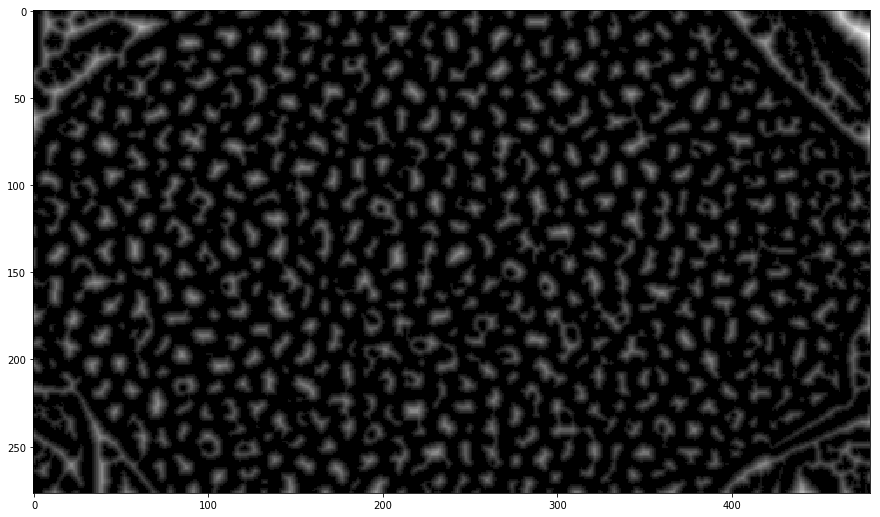

In [409]:
D = ndimage.distance_transform_edt(thresh)
plt.imshow(D, cmap='gray')

[INFO] 520 unique segments found


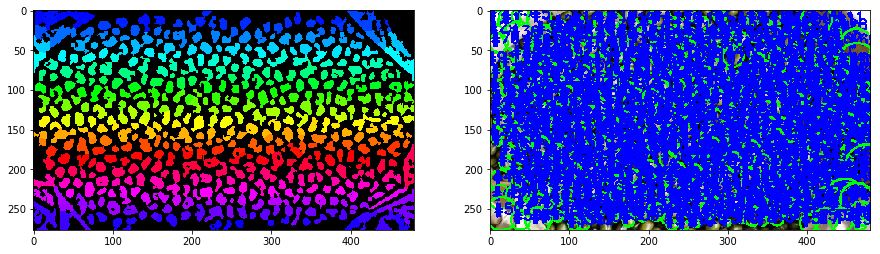

In [410]:
watershed_n_plot(D, thresh, imgs[0], min_distance=7)

# 2

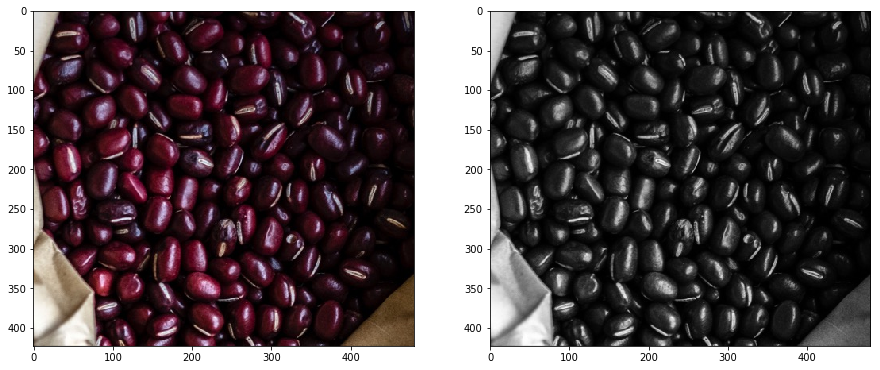

In [8]:
plt.subplot(1,2,1)
plt.imshow(imgs[1])
plt.subplot(1,2,2)
plt.imshow(grayscaled[1], cmap='gray')

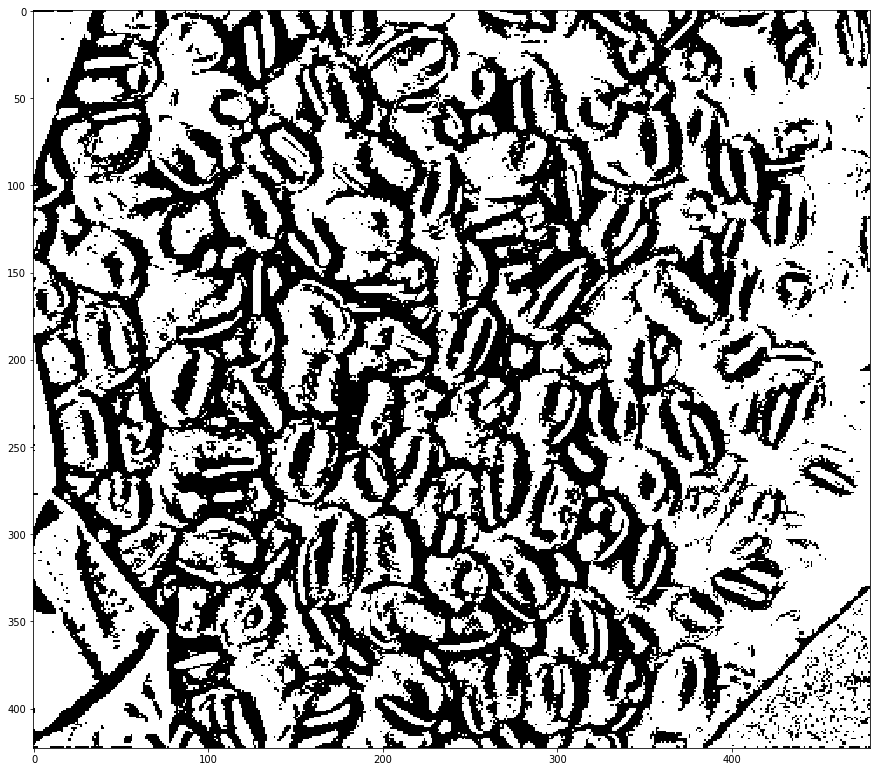

In [9]:
gray = imgs[1][:,:,2]
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,23, 5)

plt.imshow(thresh, cmap='gray')

# 3

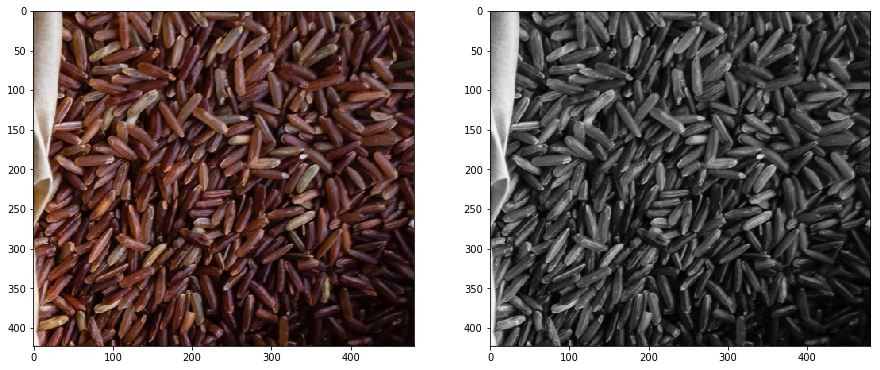

In [10]:
plt.subplot(1,2,1)
plt.imshow(imgs[2])
plt.subplot(1,2,2)
plt.imshow(grayscaled[2], cmap='gray')

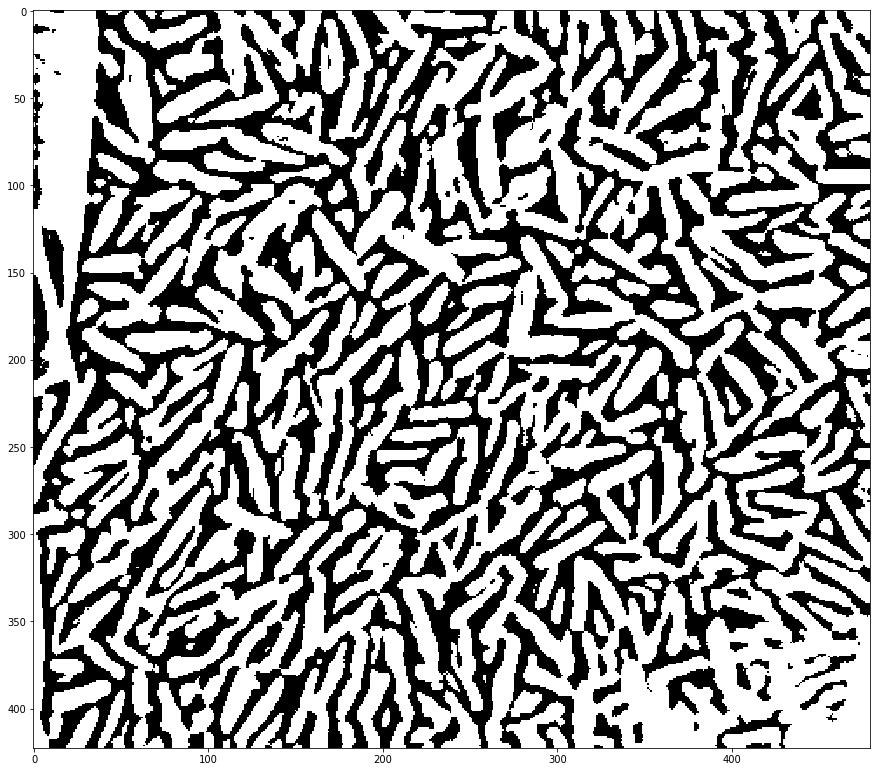

In [411]:
gray = grayscaled[2]
gray = cv2.GaussianBlur(gray, (5,5), 30)
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,23, 5)

plt.imshow(thresh, cmap='gray')

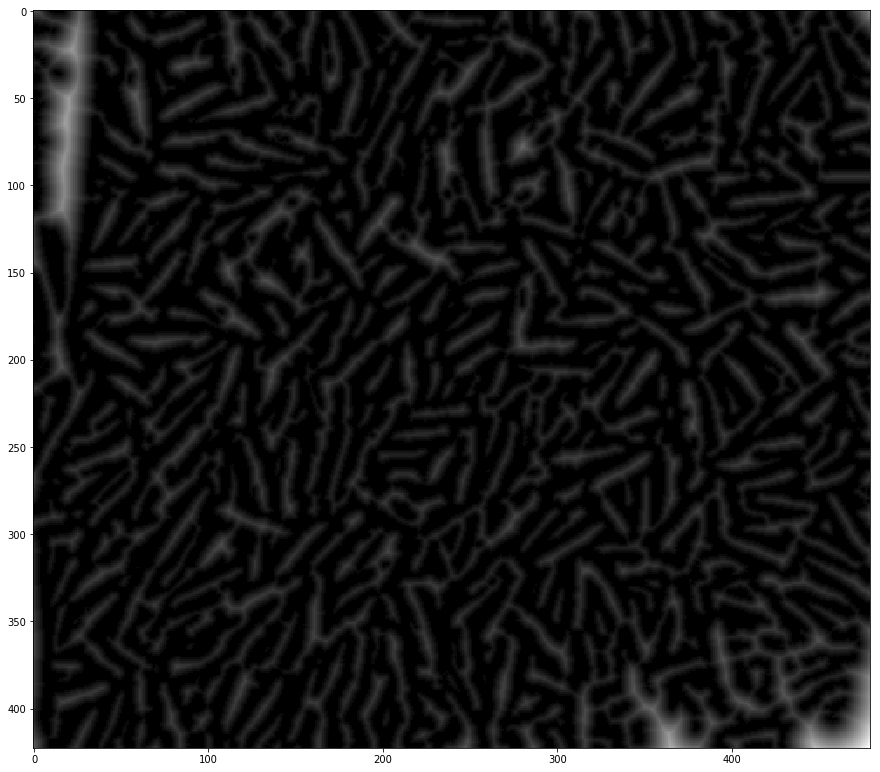

In [412]:
D = ndimage.distance_transform_edt(thresh)
plt.imshow(D, cmap='gray')

[INFO] 664 unique segments found


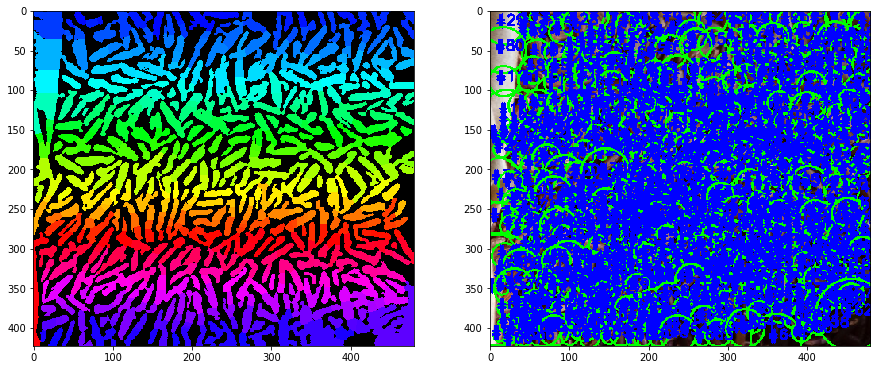

In [414]:
watershed_n_plot(D, thresh, imgs[2], min_distance=8)

# 4

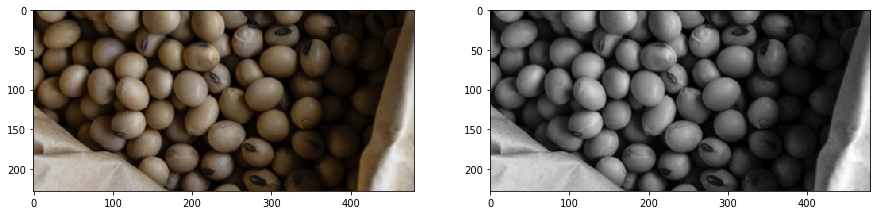

In [14]:
plt.subplot(1,2,1)
plt.imshow(imgs[3])
plt.subplot(1,2,2)
plt.imshow(grayscaled[3], cmap='gray')

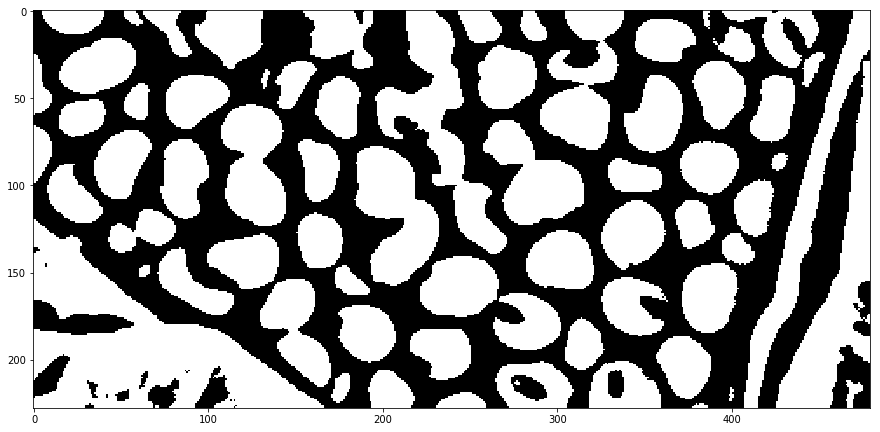

In [421]:
gray = grayscaled[3]
gray = cv2.GaussianBlur(gray, (5,5), 15)
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,69, 3)

plt.imshow(thresh, cmap='gray')

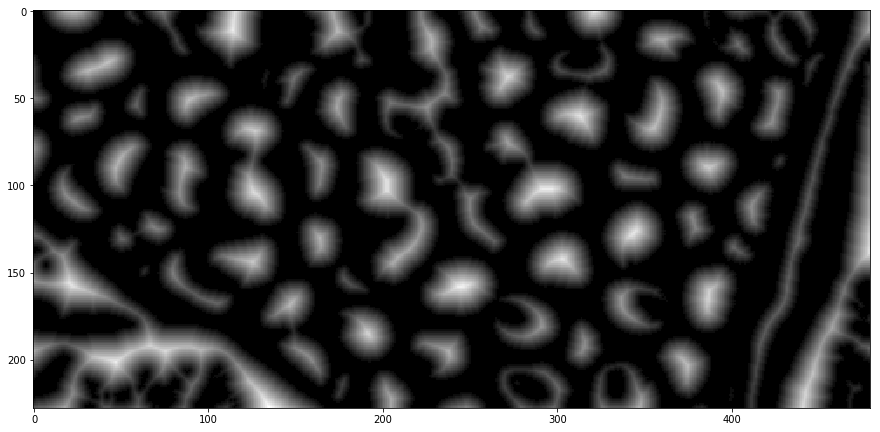

In [422]:
D = ndimage.distance_transform_edt(thresh)
plt.imshow(D, cmap='gray')

[INFO] 85 unique segments found


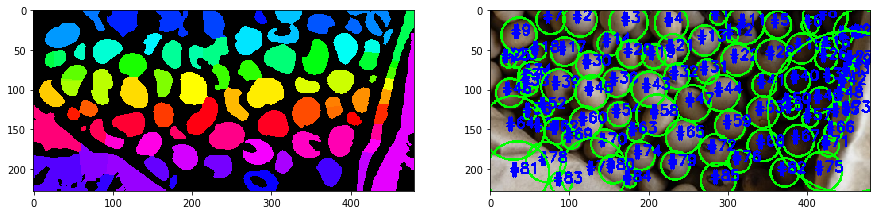

In [424]:
watershed_n_plot(D, thresh, imgs[3], min_distance=10)

# 5

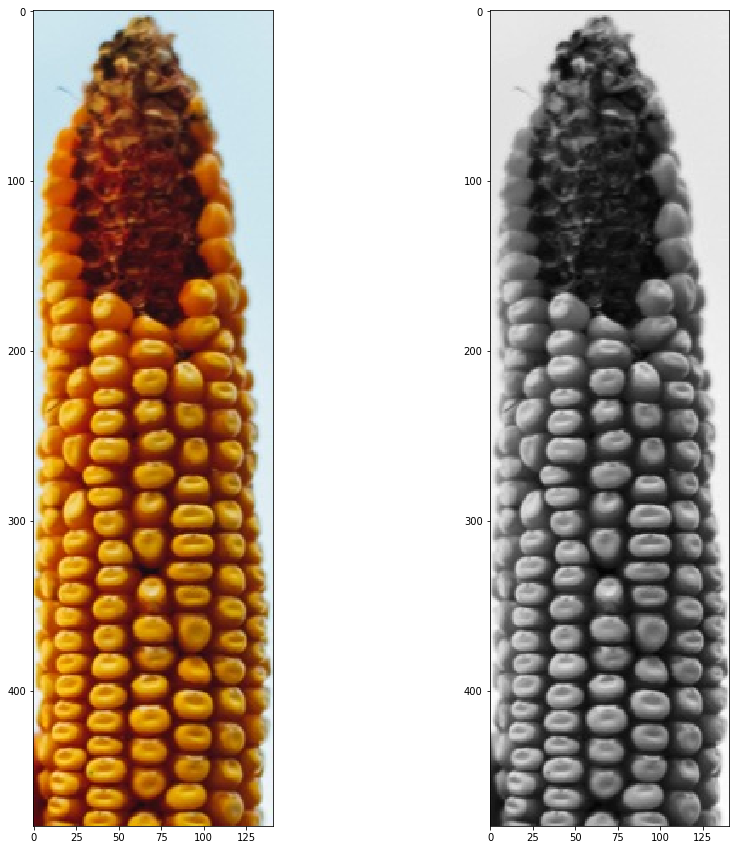

In [337]:
plt.subplot(1,2,1)
plt.imshow(imgs[4])
plt.subplot(1,2,2)
plt.imshow(grayscaled[4], cmap='gray')

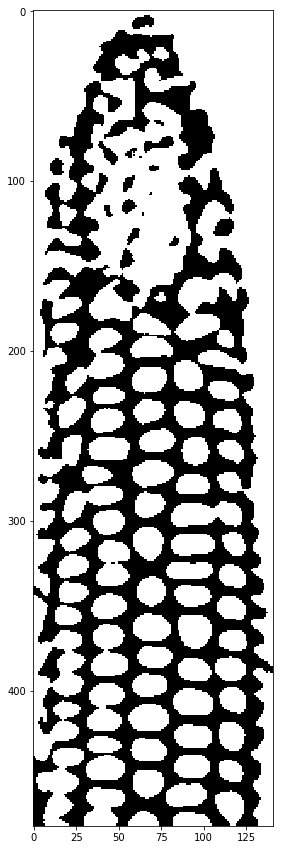

In [399]:
gray = grayscaled[4]
gray = cv2.GaussianBlur(gray, (5,5), 40)
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,51, 10)

plt.imshow(thresh, cmap='gray')

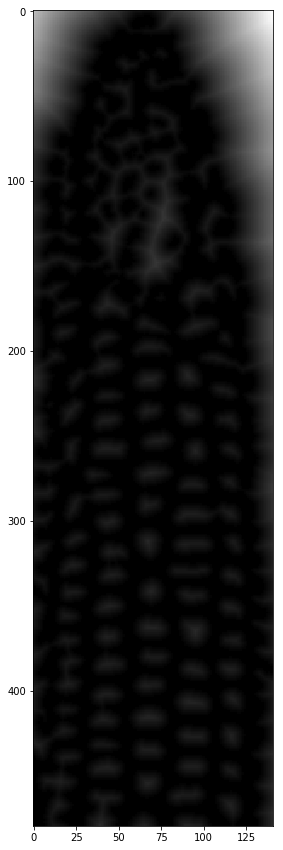

In [400]:
D = ndimage.distance_transform_edt(thresh)
plt.imshow(D, cmap='gray')

[INFO] 107 unique segments found


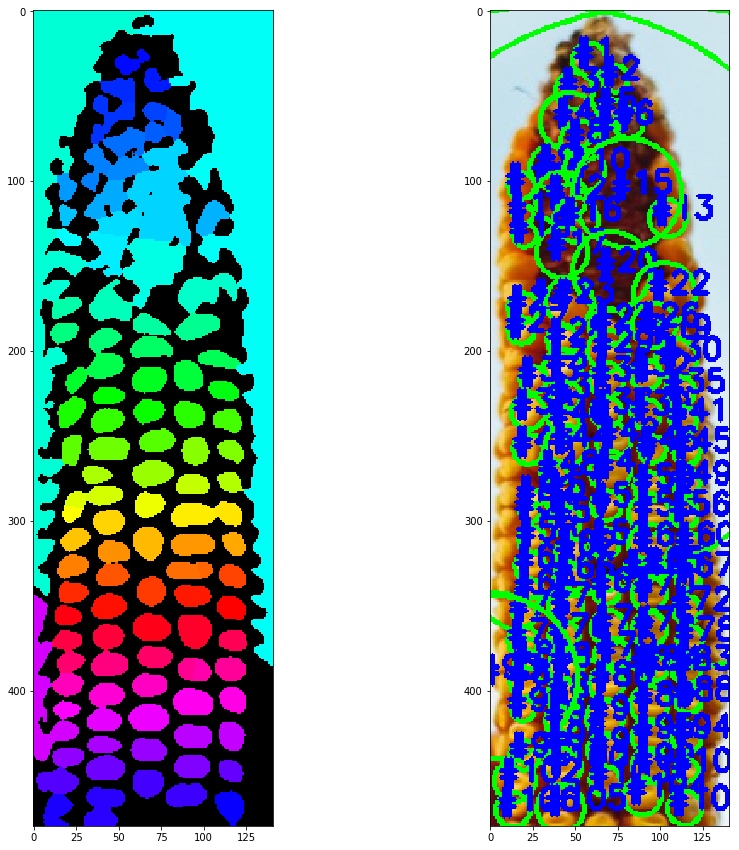

In [401]:
watershed_n_plot(D, thresh, imgs[4], min_distance=10)

# 6

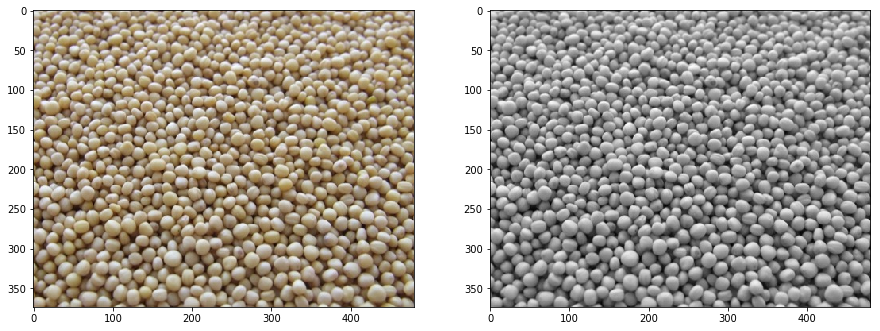

In [65]:
plt.subplot(1,2,1)
plt.imshow(imgs[5])
plt.subplot(1,2,2)
plt.imshow(grayscaled[5], cmap='gray')

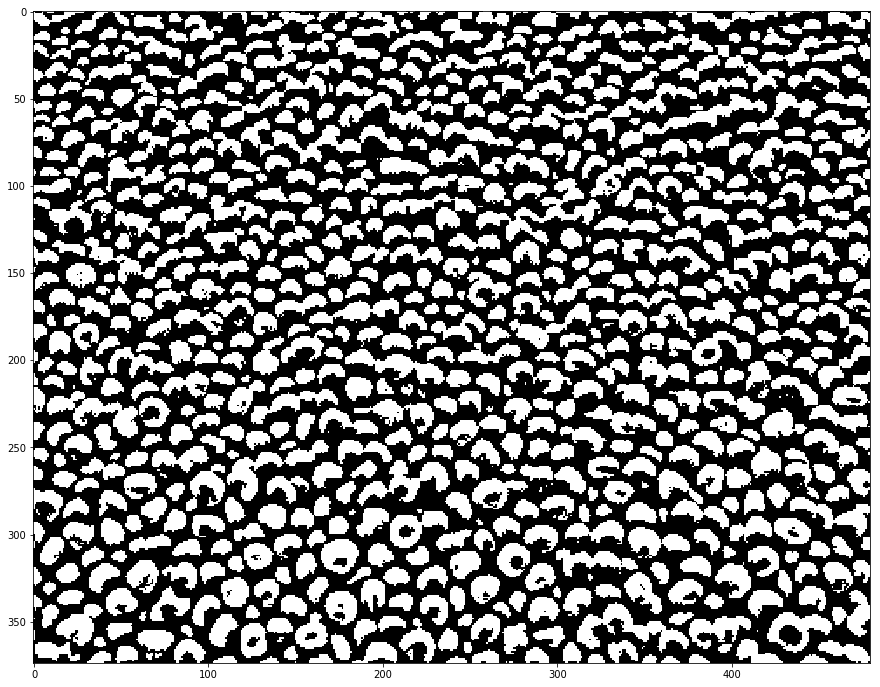

In [66]:
gray = grayscaled[5]
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,23, -4)

plt.imshow(thresh, cmap='gray')

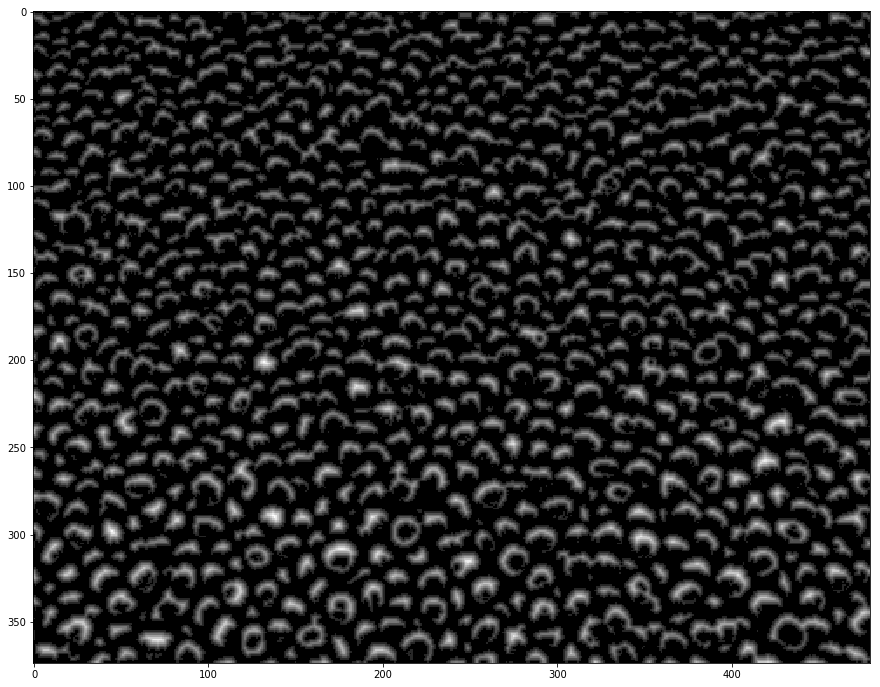

In [67]:
D = ndimage.distance_transform_edt(thresh)
plt.imshow(D, cmap='gray')

[INFO] 1266 unique segments found


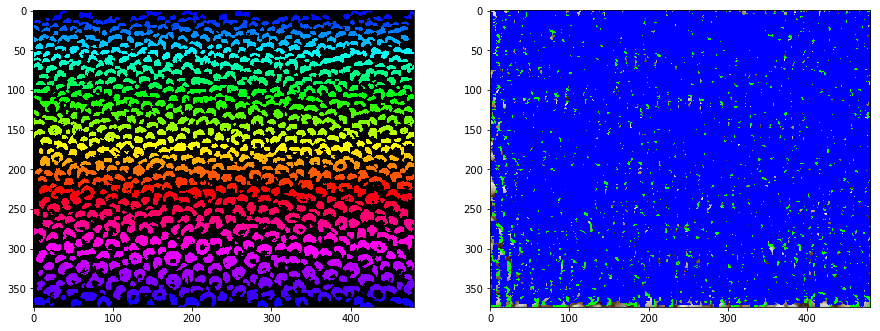

In [70]:
watershed_n_plot(D, thresh, imgs[5], min_distance=4)

# 7

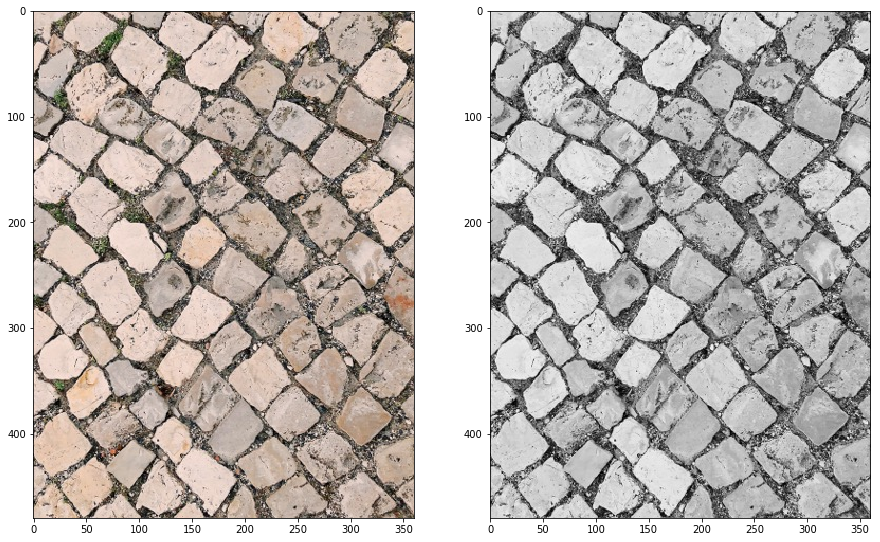

In [71]:
figsize(15,15)
plt.subplot(1,2,1)
plt.imshow(imgs[6])
plt.subplot(1,2,2)
plt.imshow(grayscaled[6], cmap='gray')

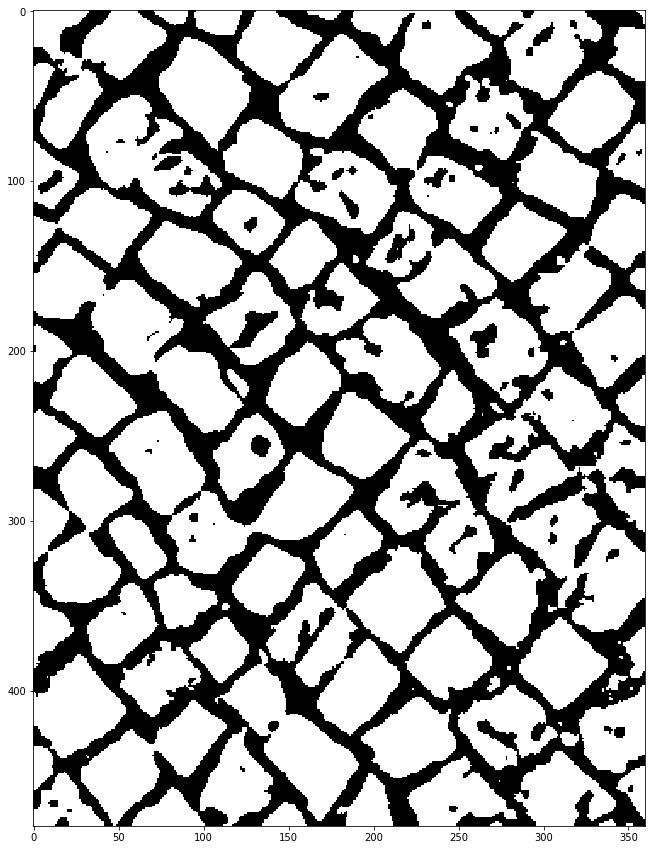

In [105]:
shifted = cv2.pyrMeanShiftFiltering(imgs[6], 20, 21)
gray = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)
#gray = grayscaled[6].copy()
#kernel = np.ones((5,5), np.uint8) 
#thresh = cv2.erode(thresh, kernel, iterations=1) 
gray = cv2.GaussianBlur(gray, (5,5), 30)
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,69, 5)
#retval, im = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
#retval, thresh = cv2.threshold(gray, 160, 255, cv2.THRESH_BINARY)
#thresh = abs(thresh.astype(int) - 255).astype('uint8')

plt.imshow(thresh, cmap='gray')

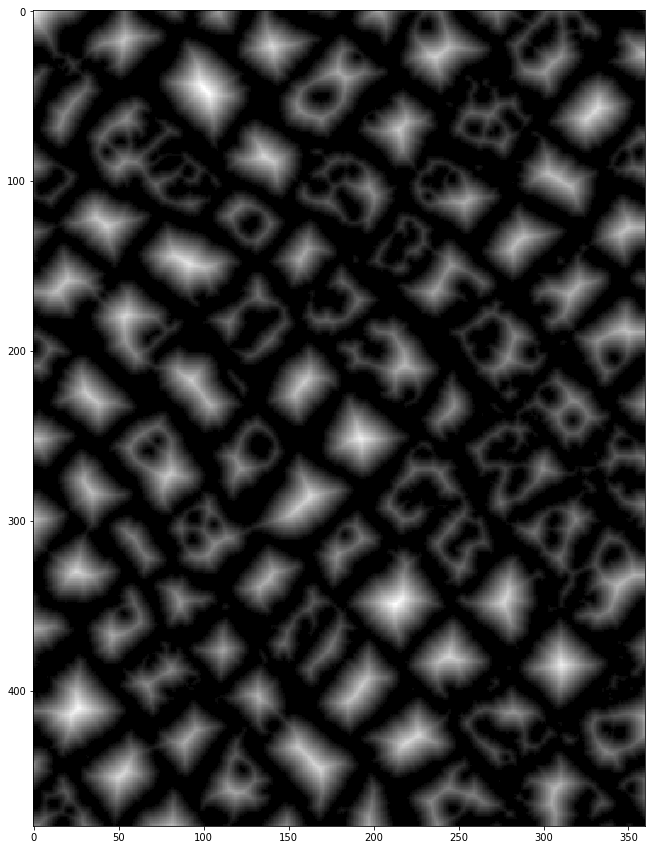

In [106]:
D = ndimage.distance_transform_edt(thresh)
plt.imshow(D, cmap='gray')

[INFO] 78 unique segments found


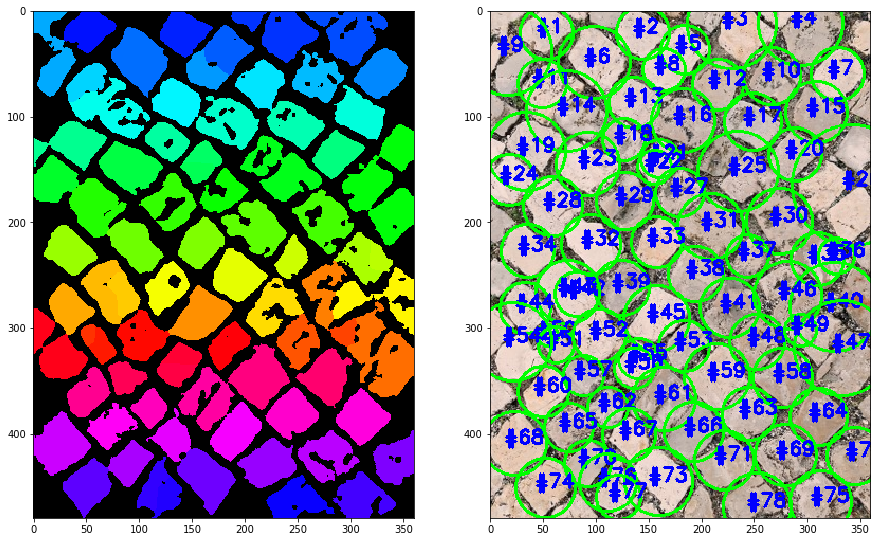

In [107]:
watershed_n_plot(D, thresh, imgs[6], min_distance=18)

# 8

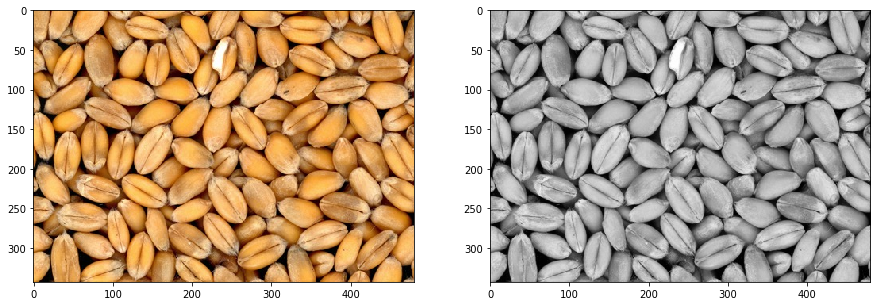

In [31]:
figsize(15,15)
plt.subplot(1,2,1)
plt.imshow(imgs[7])
plt.subplot(1,2,2)
plt.imshow(grayscaled[7], cmap='gray')

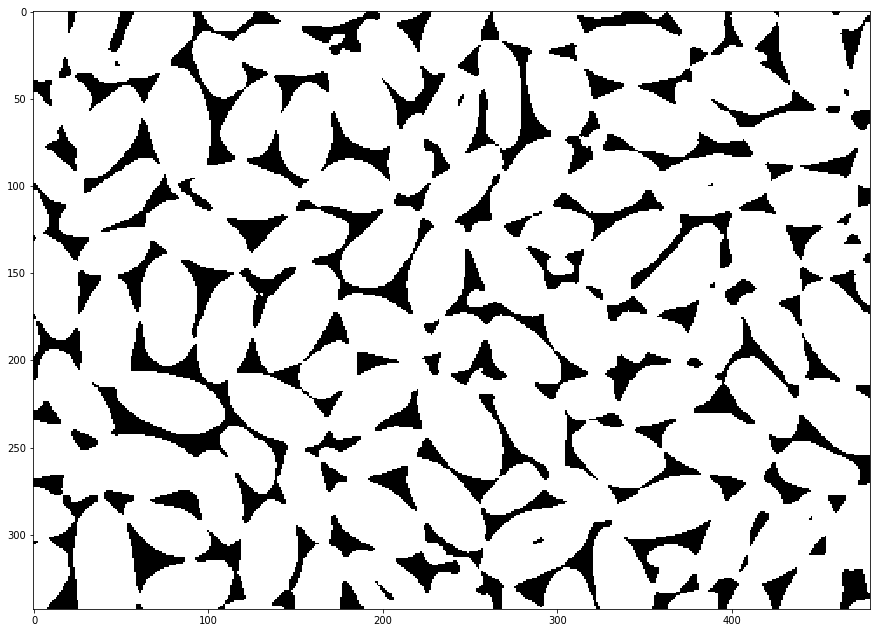

In [189]:

gray = grayscaled[7].copy()
#kernel = np.ones((5,5), np.uint8) 
#thresh = cv2.erode(thresh, kernel, iterations=1) 
gray = cv2.GaussianBlur(gray, (5,5), 25)
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,69, 37)
#retval, im = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
#retval, thresh = cv2.threshold(gray, 160, 255, cv2.THRESH_BINARY)
#thresh = abs(thresh.astype(int) - 255).astype('uint8')

plt.imshow(thresh, cmap='gray')

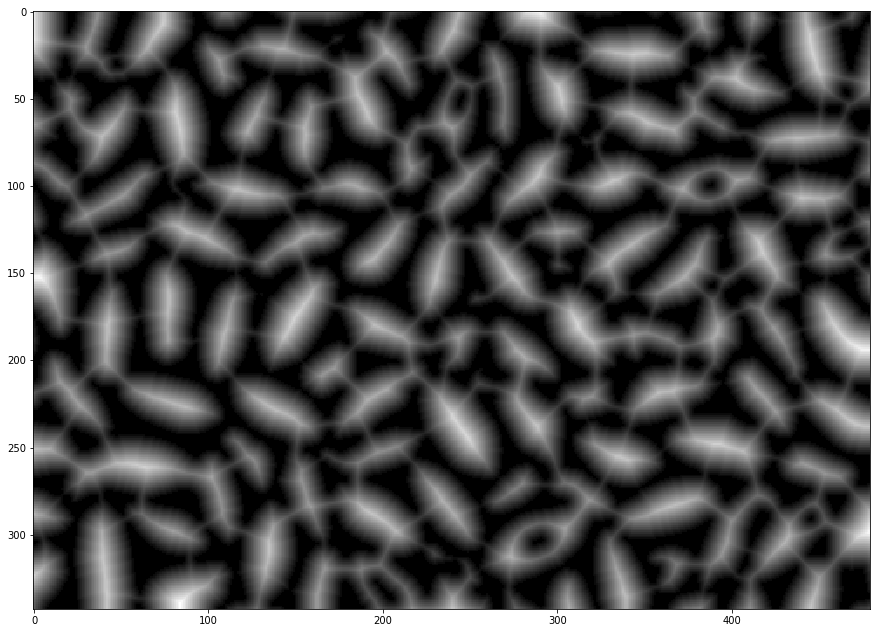

In [190]:
D = ndimage.distance_transform_edt(thresh)
plt.imshow(D, cmap='gray')

[INFO] 92 unique segments found


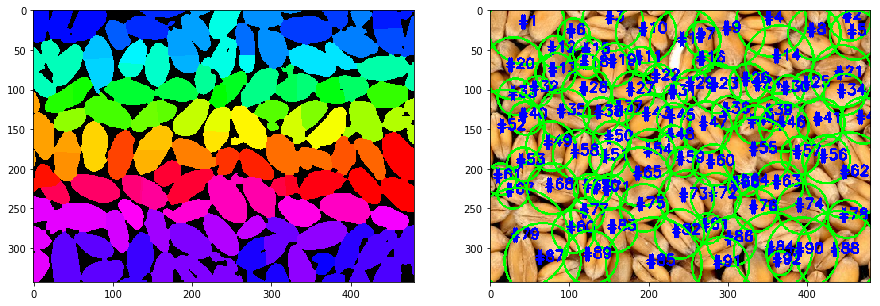

In [191]:
watershed_n_plot(D, thresh, imgs[7], min_distance=19)

# 9

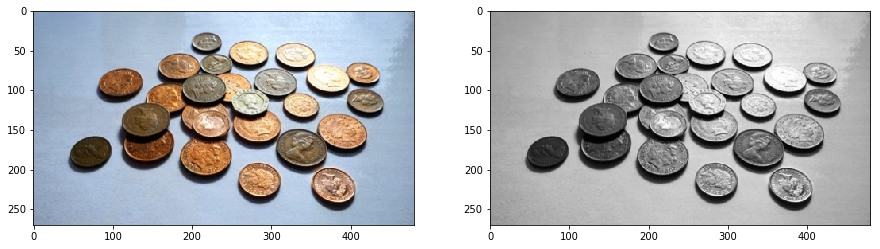

In [193]:
figsize(15,15)
plt.subplot(1,2,1)
plt.imshow(imgs[8])
plt.subplot(1,2,2)
plt.imshow(grayscaled[8], cmap='gray')

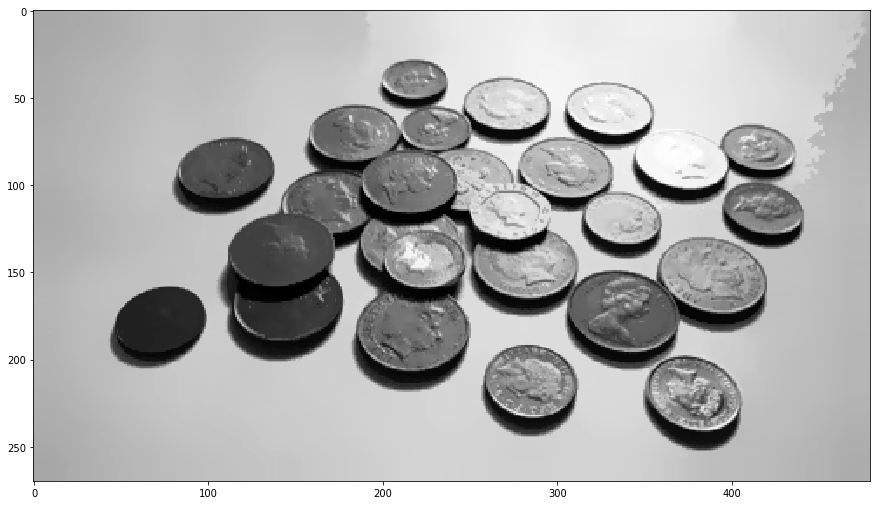

In [248]:
shifted = cv2.pyrMeanShiftFiltering(imgs[8], 11, 21)
gray = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap='gray')

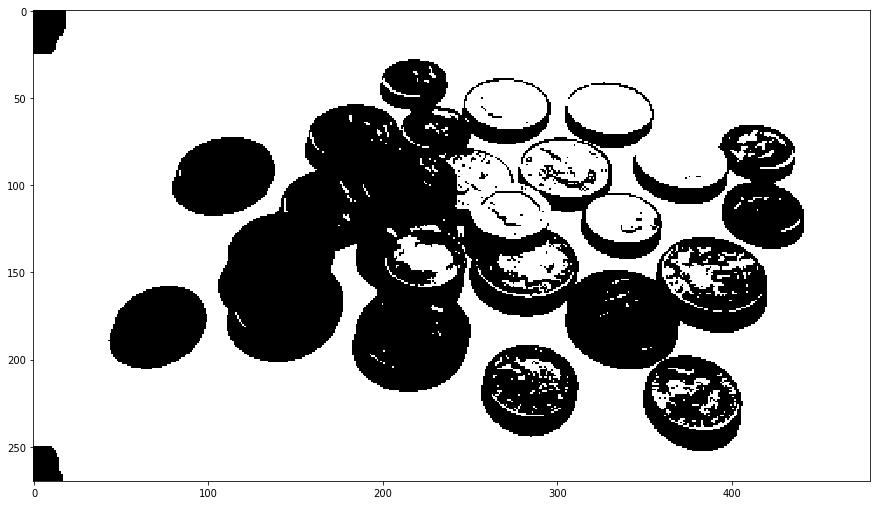

In [249]:
new = np.ones_like(gray)*255
new[gray<166] = 0
plt.imshow(new, cmap='gray')

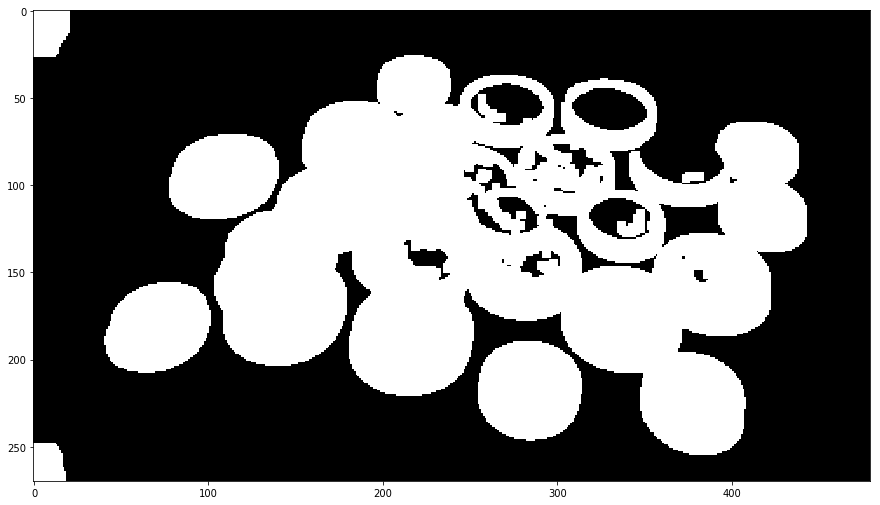

In [250]:
thresh = cv2.adaptiveThreshold(new, 255,
 cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
 cv2.THRESH_BINARY,51, -10)
#retval, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

#retval, thresh = cv2.threshold(gray, 40, 255, cv2.THRESH_BINARY)

#thresh = abs(thresh.astype(int) - 255).astype('uint8')
kernel = np.ones((5,5), np.uint8) 
thresh = cv2.erode(new, kernel, iterations=1) 
#thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,51, 1)
thresh = abs(thresh.astype(int) - 255).astype('uint8')
plt.imshow(thresh, cmap='gray')

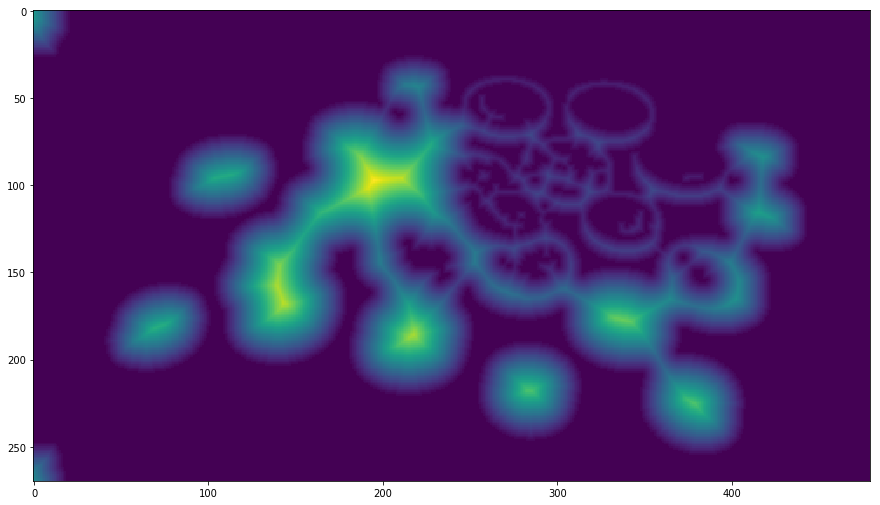

In [251]:
D = ndimage.distance_transform_edt(thresh)
plt.imshow(D)

[INFO] 19 unique segments found


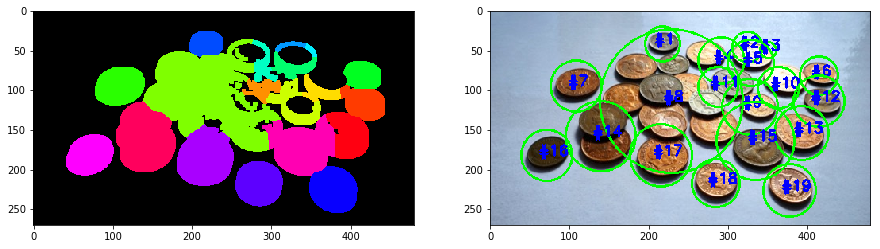

In [253]:
watershed_n_plot(D, thresh, imgs[8], min_distance=19)

# 10

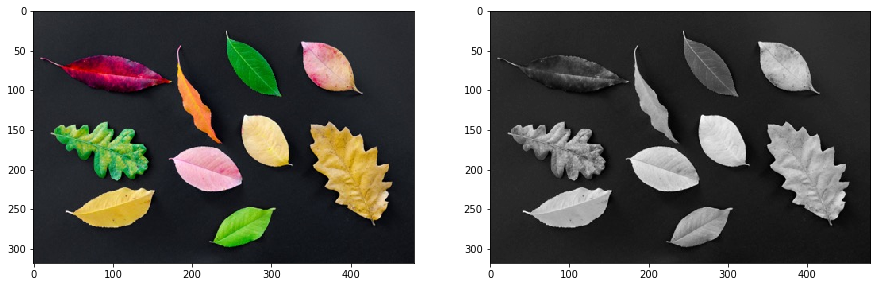

In [41]:
figsize(15,15)
plt.subplot(1,2,1)
plt.imshow(imgs[9])
plt.subplot(1,2,2)
plt.imshow(grayscaled[9], cmap='gray')

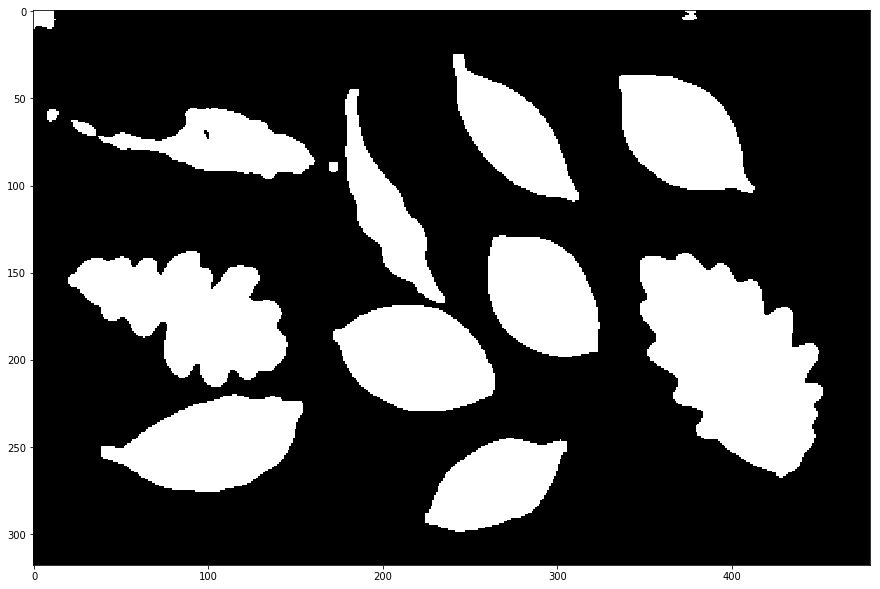

In [42]:
gray = grayscaled[9].copy()
#kernel = np.ones((5,5), np.uint8) 
#thresh = cv2.erode(thresh, kernel, iterations=1) 
#thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,21, 3)
gray = cv2.GaussianBlur(gray, (7,7), 10)
retval, thresh = cv2.threshold(gray, 50, 255, cv2.THRESH_BINARY)
#thresh = abs(thresh.astype(int) - 255).astype('uint8')
plt.imshow(thresh, cmap='gray')

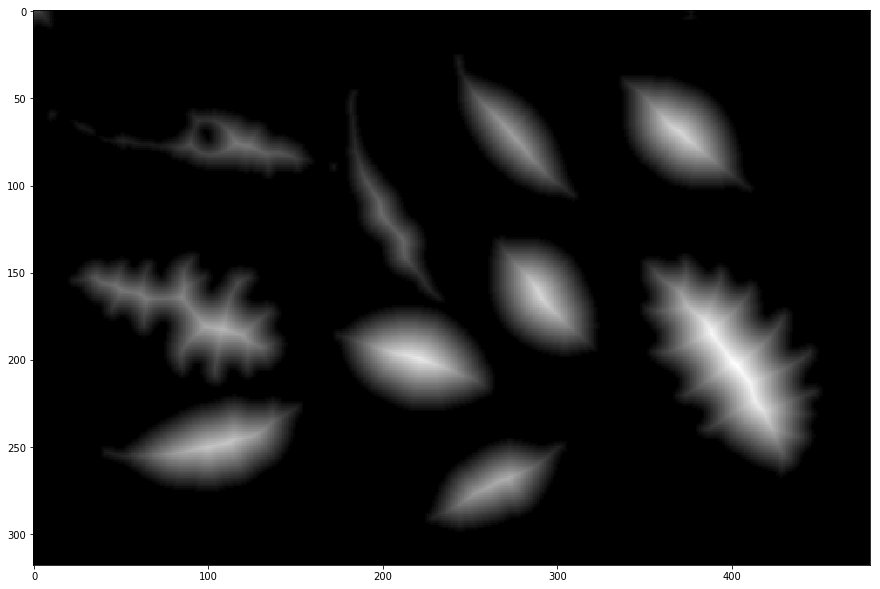

In [43]:
D = ndimage.distance_transform_edt(thresh)
plt.imshow(D, cmap='gray')

[INFO] 10 unique segments found


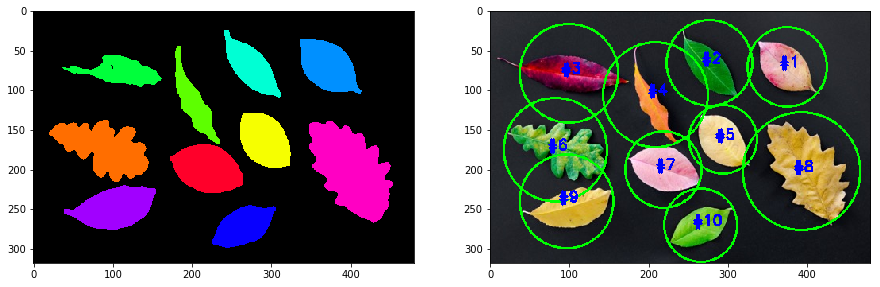

In [44]:
watershed_n_plot(D, thresh, imgs[9], min_distance=30)

# 11

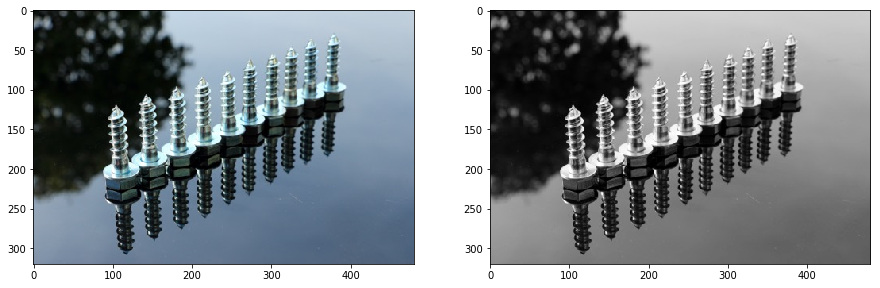

In [45]:
figsize(15,15)
plt.subplot(1,2,1)
plt.imshow(с)
plt.subplot(1,2,2)
plt.imshow(grayscaled[10], cmap='gray')

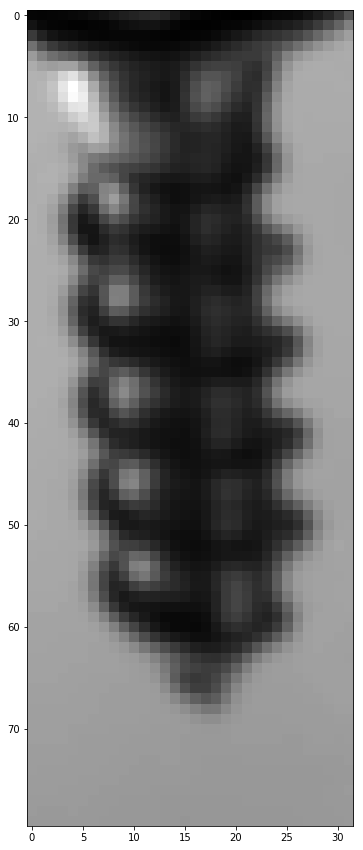

In [384]:

gray = grayscaled[10].copy()
gray = cv2.GaussianBlur(gray, (11,11), 1)

example = gray[240:320,100:132]
plt.imshow(example, cmap='gray')

10 objects were found


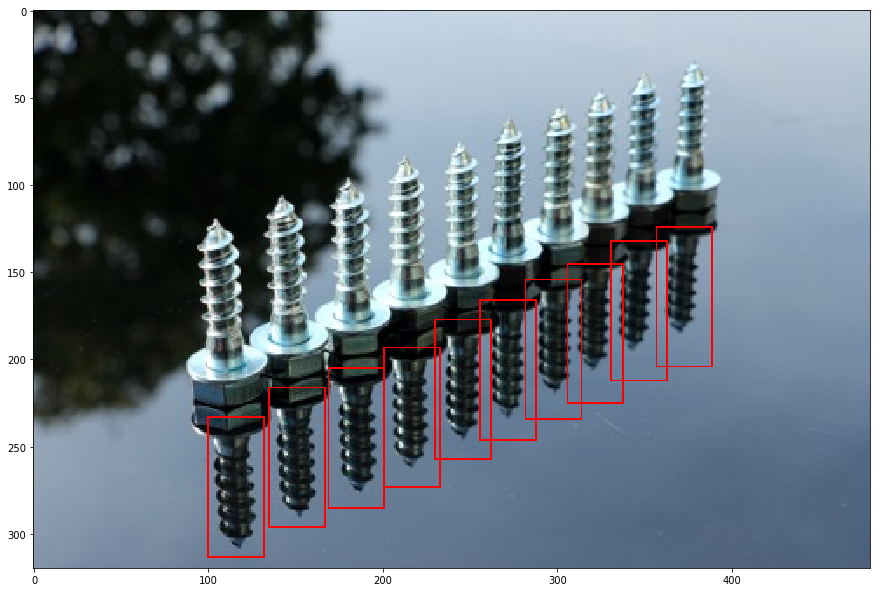

In [398]:
img_rgb = imgs[10].copy()
h,w = example.shape
res = cv2.matchTemplate(gray,example,cv2.TM_CCORR_NORMED)
threshold = 0.93
loc = np.where( res >= threshold)
prev = []
counter = 0
for pt in zip(*loc[::-1]):
    cur_x = pt[0]
    cur_y = pt[1]
    dist = [np.power((cur_x-pr[0])**2+(cur_y-pr[1])**2, 0.5) > 25 for pr in prev]
    if len(prev) == 0 or all(dist):
        cv2.rectangle(img_rgb, pt, (cur_x+w, cur_y+h), (255,0,0), 1)
        counter += 1
        prev.append([cur_x, cur_y])

print("{} objects were found".format(counter))
plt.imshow(img_rgb, cmap='gray')

# 12

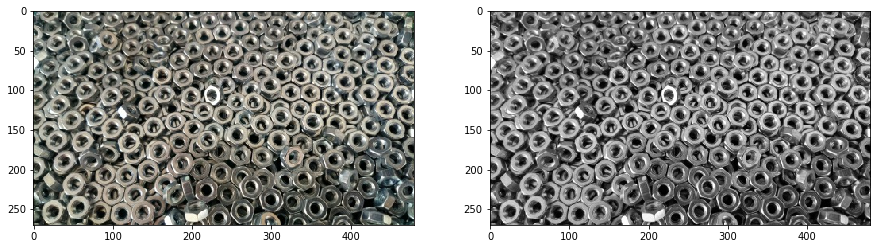

In [291]:
figsize(15,15)
plt.subplot(1,2,1)
plt.imshow(imgs[11])
plt.subplot(1,2,2)
plt.imshow(grayscaled[11], cmap='gray')

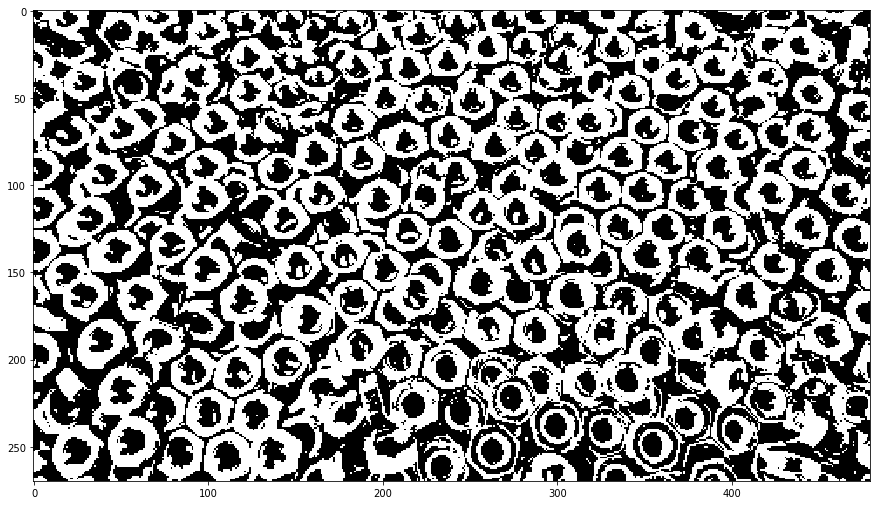

In [292]:
gray = grayscaled[11].copy()
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,69, 2)
#thresh = abs(thresh.astype(int) - 255).astype('uint8')
plt.imshow(thresh, cmap='gray')

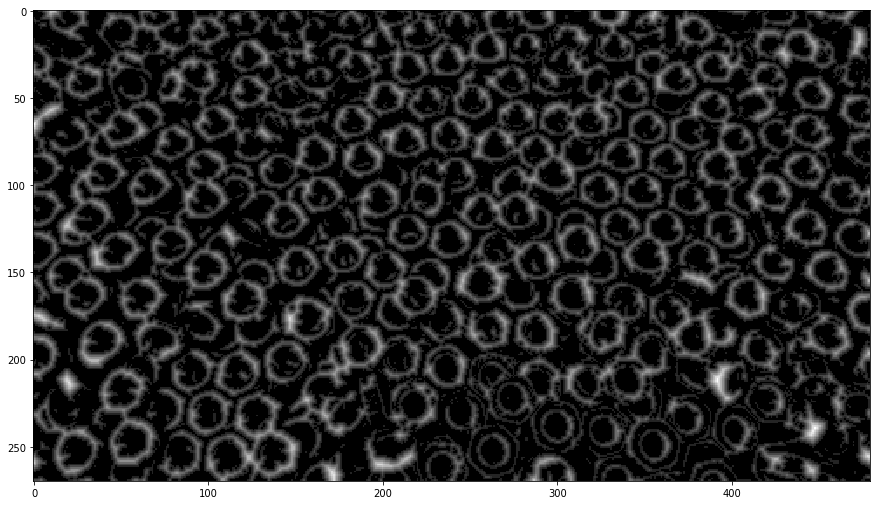

In [293]:
D = ndimage.distance_transform_edt(thresh)
plt.imshow(D, cmap='gray')

[INFO] 374 unique segments found


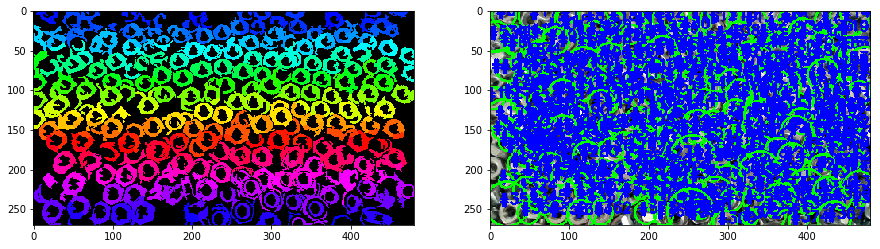

In [294]:
watershed_n_plot(D, thresh, imgs[11], min_distance=9)